In [52]:
from src.models import InputImage
from matplotlib import pyplot as plt
from src.well import find_well_props
import cv2
from skimage.color import gray2rgb

# Functions

In [37]:
def plot_images(images, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary'):
    if count is not None:
        images = images[0:count]

    l = len(images)

    if cols is None:
        cols = 4
    rows = int(l / cols)
    if l < cols: cols = l
    if l % cols != 0 or rows == 0:
        rows += 1

    fig, ax = plt.subplots(rows, cols, figsize=fig)
    ax = ax.ravel()
    for i, img in enumerate(images):
        if i >= l: return

        if not ticks:  # turn off ticks
            ax[i].get_xaxis().set_visible(False)
            ax[i].get_yaxis().set_visible(False)

        ax[i].imshow(img, cmap)  # Change this!


In [47]:
def plot_fishes(fishes, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary'):
    images = list(map(lambda x: x.processed, fishes))
    plot_images(images, cols, count, fig, ticks, cmap)

In [39]:
def draw_circle_on_og(image: InputImage):
    c_image = gray2rgb(image.og)  # Converting back to RGB to be able to put colorful indicators for center and line
    circle = image.well_props.center
    cv2.circle(c_image, (circle[0], circle[1]), image.well_props.radius, (255, 0, 0), 2)  # draw the outer circle
    cv2.circle(c_image, (circle[0], circle[1]), 1, (0, 255, 0), 4)  # draw the center
    return c_image

# Images

In [40]:
fishes = [InputImage("zf1.JPG"), InputImage("zf2.JPG"), InputImage("zf3.JPG"), InputImage("zf4.JPG"),
          InputImage("zf5.JPG"), InputImage("zf6.JPG")]

# Test circles made

In [41]:
for fish in fishes:
    fish = find_well_props(fish)

# Searching for well properties
_____________________________________________________________
# Hough-transformation for the well
_____________________________________________________________
# Hough-transformation finished
_____________________________________________________________
# Creating circle mask for well
_____________________________________________________________
# Circle mask for well created
_____________________________________________________________
# Creating remaining masks:
_____________________________________________________________
# Creating cropped mask
_____________________________________________________________
# Creating masked image (original)
_____________________________________________________________
# Creating masked image (cropped)
_____________________________________________________________
# Created remaining masks
_____________________________________________________________
# Finished searching for well properties
_____________________________

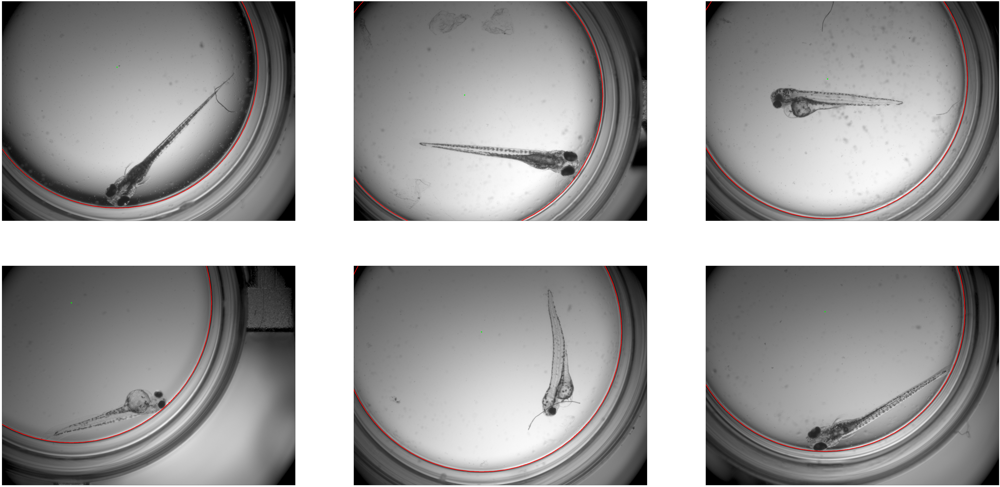

In [56]:
circled_fishes = []

for i, fish in enumerate(fishes):
    circled_fishes.append(draw_circle_on_og(fish))

plot_images(circled_fishes, cols=3, fig=(100, 50), cmap='brg')

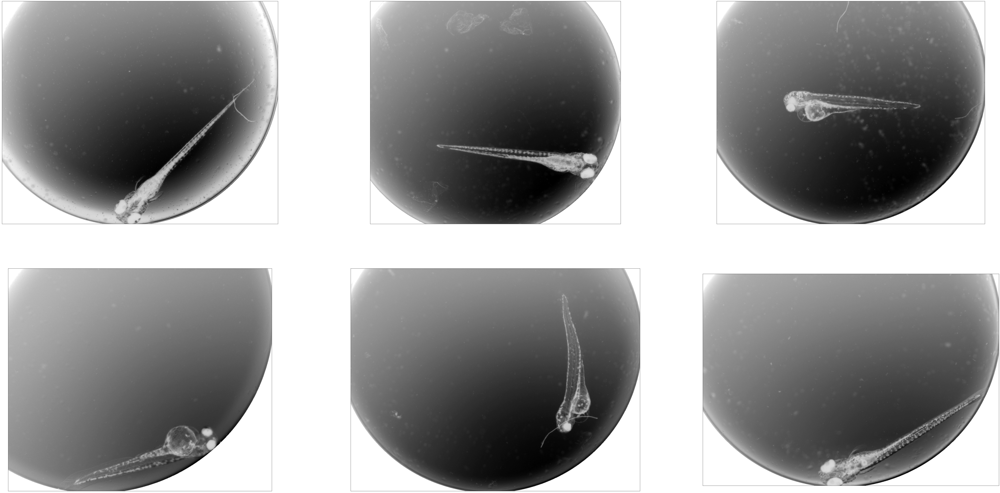

In [59]:
plot_fishes(fishes, cols=3, fig=(100, 50))